## Segmentation d'images

<img src="mySaves/other_images/logo_future_vision_transport.png" alt="logo_future_vision_transport" width="400" class="center"/>

# Scrips

## I. Imports

In [2]:
# imports
import tensorflow as tf
import keras

import os
os.environ["SM_FRAMEWORK"] = 'tf.keras'
# %env SM_FRAMEWORK=tf.keras



import segmentation_models as sm

import albumentations as A



import numpy as np

import matplotlib.pyplot as plt

import myFunction as mf
%load_ext autoreload
    
%autoreload 2

import time

import pandas as pd

from joblib import dump, load

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
# for requierements.txt
# pipreqs --force --ignore Patin_Clement_2_API_042024, Patin_Clement_3_application_Flask_042024  --scan-notebooks

In [4]:
# create folder for saving
if not os.path.isdir("mySaves"):
    os.mkdir("mySaves")

## II. Accéder au dataset des images : Data Generator

Définir le dictionnaire pour passer de 32 à 8 catégories :

In [5]:
# dictionnary macro / micro classes
cats = {'void': [0, 1, 2, 3, 4, 5, 6],
 'flat': [7, 8, 9, 10],
 'construction': [11, 12, 13, 14, 15, 16],
 'object': [17, 18, 19, 20],
 'nature': [21, 22],
 'sky': [23],
 'human': [24, 25],
 'vehicle': [26, 27, 28, 29, 30, 31, 32, 33, -1]}

Définir un mapping pour de couleur pour ces classes :

In [6]:
# array with RGB colors, one for each macro class
cats_colors = np.array([
        [0, 0, 0],
        [128, 64,128],
        [70, 70, 70],
        [153,153,153],
        [107,142, 35],
        [70,130,180],
        [220, 20, 60],
        [0,  0,142]
])

Utilisation de la classe `generator` :

In [7]:
# define shared "random_state" for creating the validation and test generators
same_random_state = 16
same_test_size = 0.3

# define shared "batch_size"
batch_size = 32

In [8]:
# use custom class "generator"

# no backbone, no augmentation
train_gen = mf.generator(
    batch_size=batch_size,
    images_path='P8_Cityscapes_leftImg8bit_trainvaltest/leftImg8bit/', 
    masks_path='P8_Cityscapes_gtFine_trainvaltest/gtFine/',
    image_size=(256, 256*2),
    which_set="train",
    n_images=512,
    cats=cats,
    backbone = None,
    augmentation=None,
    shuffle=True
)


valid_gen = mf.generator(
    batch_size=batch_size,
    images_path='P8_Cityscapes_leftImg8bit_trainvaltest/leftImg8bit/', 
    masks_path='P8_Cityscapes_gtFine_trainvaltest/gtFine/',
    image_size=(256, 256*2),
    which_set="val",
    n_images=128,
    cats=cats,
    backbone = None,
    augmentation=None,
    shuffle=False,
    split=True,
    split_test_size=same_test_size,
    split_keep="split_train",
    split_rs=same_random_state
)


test_gen = mf.generator(
    batch_size=batch_size,
    images_path='P8_Cityscapes_leftImg8bit_trainvaltest/leftImg8bit/', 
    masks_path='P8_Cityscapes_gtFine_trainvaltest/gtFine/',
    image_size=(256, 256*2),
    which_set="val",
    n_images=128,
    cats=cats,
    backbone = None,
    augmentation=None,
    shuffle=False,
    split=True,
    split_test_size=same_test_size,
    split_keep="split_test",
    split_rs=same_random_state
)

## III. Métriques et fonction de perte

Pour la **métrique d'évaluation**, utilisation du `mean IoU score` (ou *indice de Jaccard*), moyenne des *intersection over union* de chaque classe prédite. L'`IoU` est calculé en divisant l'aire de l'intersection entre la zone prédite par le modèle et la zone réelle de l'objet par l'aire de leur union. Il s'agit d'une mesure la similarité entre ces zones, qui se calcule donc comme le rapport entre :
- la zone correctement prédite (les TP)
<br>et<br>
- les zones correctement prédites (TP), incorrectement prédites (FP) et réelles non détectées (FN)

Enregistrement également du coefficient de *Dice*, ou `FScore`, qui est une autre mesure de similarité, qui se calcule donc comme le rapport entre :
- 2 X la zone correctement prédite (les TP)
<br>et<br>
- les zones réelles (TP+FN) et prédites (TP+FP)

Enfin, capture du **temps d'entraînement** des modèles.


In [9]:
# define metrics
jaccard = sm.metrics.IOUScore(threshold=0.5)
dice = sm.metrics.FScore()
metrics = [jaccard, dice]

La fonction de perte « classique » pour les modèles de classification à plusieurs catégories est la *Categorical Cross Entropy*. 
 
Mais celle-ci n’est pas forcément la plus utilisée pour la segmentation.

On lui préfère parfois la *Focal Loss*, qui en est une variation, et qui permet de pénaliser l’impact des exemples faciles et de mettre en avant les exemples les plus compliqués.
 

On peut utiliser également la *Dice Loss* qui est calculé à partir du coefficient de Dice (`= 1- FScore`). Cette fonction de perte a la particularité de se calculer à l’échelle de globale.
 

Pour le projet, nous utilisons **une combinaison de la Focal Loss et de la Dice Loss, ce qui nous permet de considérer l’échelle locale et l’échelle globale**.

*Nota : la Dice Loss possède un argument class_weights permettant d’avantager ou pénaliser telle ou telle classe (lors du calcul de la moyenne des FScores de chaque classe). Dans un premier temps, nous n’utiliserons pas cette possibilité.*

In [10]:
# define combined loss
dice_loss = sm.losses.DiceLoss(class_weights=np.array([0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.125]))
focal_loss = sm.losses.CategoricalFocalLoss()
total_loss = dice_loss + (1 * focal_loss)

## IV. Model simple, notre baseline

Utilisation de la fonction `baseline_model` pour créer un modèle de segmentation semantique simple.

In [11]:
# extract input_shape from the generator
input_shape = train_gen[0][0][0].shape
# the number of classes is given by the "cats" dictionnary
classes = len(cats)
# optimizer
learning_rate = 0.001
optimizer = keras.optimizers.Adam(learning_rate=learning_rate)
# model
baseline = mf.baseline_model(input_shape=input_shape, num_classes=classes)
# compile
baseline.compile(
    optimizer=optimizer,
    loss=total_loss,
    metrics=metrics
)
# print summary
baseline.summary()





Model: "baseline_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 256, 512, 64)      1792      
                                                                 
 conv2d_1 (Conv2D)           (None, 256, 512, 64)      36928     
                                                                 
 max_pooling2d (MaxPooling2  (None, 128, 256, 64)      0         
 D)                                                              
                                                                 
 conv2d_2 (Conv2D)           (None, 128, 256, 128)     73856     
                                                                 
 conv2d_3 (Conv2D)           (None, 128, 256, 128)     147584    
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 64, 128, 128)      0         
 g2D)                                             

In [12]:
# create folder for saving
if not os.path.isdir("mySaves/models"):
    os.mkdir("mySaves/models")

In [13]:
# initiate a tab to store results
results = pd.DataFrame(columns=["model", "backbone", "loss_function", "val_iou", "val_f_score", "training_time", "augmentation"])

Pour l'entraînement, nous utilisons un *callback* `EarlyStopping` avec une `patience = 3` : 

In [14]:

if "baseline.h5" in os.listdir("mySaves/models") :
    baseline.load_weights("mySaves/models/baseline.h5")
    training_time = load("mySaves/training_times/baseline_training_time.joblib")

else :
    # define callback
    callbacks = [
    keras.callbacks.EarlyStopping(monitor="val_iou_score", patience=3, mode="max", restore_best_weights=True, start_from_epoch=10)
    ]
    # initiate timer
    start = time.time()
    # fit
    baseline.fit(
    x=train_gen,
    steps_per_epoch=len(train_gen),
    epochs=100,
    validation_data=valid_gen,
    callbacks=callbacks
    )
    # get training time
    training_time = time.time() - start
    # save
    baseline.save_weights("mySaves/models/baseline.h5")
    dump(training_time,"mySaves/training_times/baseline_training_time.joblib")



In [15]:
# compute scores
scores = baseline.evaluate(valid_gen)



2/2 [==============================] - 21s 9s/step - loss: 0.9776 - iou_score: 0.3879 - f1-score: 0.4902


In [16]:
# update "results" tab
new_results = ["baseline", "", "dice+focal"] + scores[1:] + [training_time, "No"]
results.loc[results.shape[0],:] =  new_results
results

,model,backbone,loss_function,val_iou,val_f_score,training_time,augmentation
0,baseline,,dice+focal,0.387861,0.490223,15553.263523,No


1/1 [==============================] - 2s 2s/step


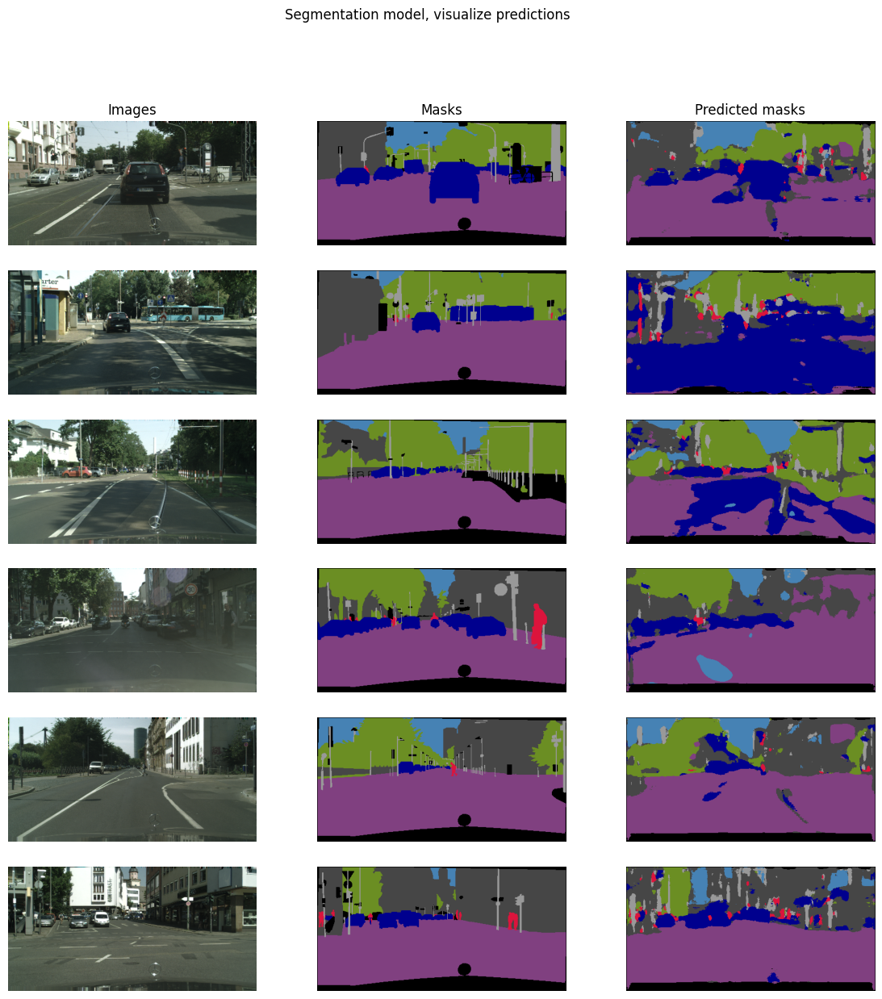

In [17]:
# use custom fonction to visualize some predictions
mf.testModel(model=baseline, test_gen=test_gen, n_images=6, cats_colors=cats_colors, random_state=16)

In [18]:
del baseline
import gc
gc.collect()

37635

## V. Comparaison de deux modèles - **Resnet34** vs **VGG16**

### V.1. Resnet34

In [19]:
# use custom class "generator"

# backbone
backbone_name = 'resnet34'

# without augmentations for training
train_gen = mf.generator(
    batch_size=batch_size,
    images_path='P8_Cityscapes_leftImg8bit_trainvaltest/leftImg8bit/', 
    masks_path='P8_Cityscapes_gtFine_trainvaltest/gtFine/',
    image_size=(256, 256*2),
    which_set="train",
    n_images=512,
    cats=cats,
    backbone = backbone_name,
    augmentation=None,
    shuffle=True
)

valid_gen = mf.generator(
    batch_size=batch_size,
    images_path='P8_Cityscapes_leftImg8bit_trainvaltest/leftImg8bit/', 
    masks_path='P8_Cityscapes_gtFine_trainvaltest/gtFine/',
    image_size=(256, 256*2),
    which_set="val",
    n_images=128,
    cats=cats,
    backbone = backbone_name,
    augmentation=None,
    shuffle=False,
    split=True,
    split_test_size=same_test_size,
    split_keep="split_train",
    split_rs=same_random_state
)


test_gen = mf.generator(
    batch_size=batch_size,
    images_path='P8_Cityscapes_leftImg8bit_trainvaltest/leftImg8bit/', 
    masks_path='P8_Cityscapes_gtFine_trainvaltest/gtFine/',
    image_size=(256, 256*2),
    which_set="val",
    n_images=128,
    cats=cats,
    backbone = None,
    augmentation=None,
    shuffle=False,
    split=True,
    split_test_size=same_test_size,
    split_keep="split_test",
    split_rs=same_random_state
)


In [20]:
# input shape
input_shape = train_gen[0][0][0].shape
# activation
activation = "softmax"

# unet model with resnet backbone 
unet_resnet34 = sm.Unet(
    backbone_name=backbone_name,
    input_shape=input_shape,
    classes=classes,
    activation=activation, 
    encoder_weights='imagenet'
)
# compile
unet_resnet34.compile(
    optimizer=optimizer,
    loss=total_loss,
    metrics=metrics
)
# print summary
unet_resnet34.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 data (InputLayer)           [(None, 256, 512, 3)]        0         []                            
                                                                                                  
 bn_data (BatchNormalizatio  (None, 256, 512, 3)          9         ['data[0][0]']                
 n)                                                                                               
                                                                                                  
 zero_padding2d (ZeroPaddin  (None, 262, 518, 3)          0         ['bn_data[0][0]']             
 g2D)                                                                                             
                                                                                            

In [21]:
if "resnet34.h5" in os.listdir("mySaves/models") :
    unet_resnet34.load_weights("mySaves/models/resnet34.h5")
    training_time = load("mySaves/training_times/resnet34_training_time.joblib")

else :
    # define callback
    callbacks = [
        keras.callbacks.EarlyStopping(monitor="val_iou_score", patience=3, mode="max", restore_best_weights=True, start_from_epoch=10)
    ]
    # initiate timer
    start = time.time()
    # fit
    unet_resnet34.fit(
        x=train_gen,
        steps_per_epoch=len(train_gen),
        epochs=100,
        validation_data=valid_gen,
        callbacks=callbacks
    )
    # get training time
    training_time = time.time() - start
    # save
    unet_resnet34.save_weights("mySaves/models/resnet34.h5")
    dump(training_time,"mySaves/training_times/resnet34_training_time.joblib")

In [22]:
# compute score on validation set
scores = unet_resnet34.evaluate(valid_gen)

2/2 [==============================] - 11s 4s/step - loss: 0.9247 - iou_score: 0.6572 - f1-score: 0.7023


In [23]:
# update "results" tab
new_results = ["unet", "resnet34", "dice+focal"] + scores[1:] + [training_time, "No"]
results.loc[results.shape[0],:] =  new_results
results

,model,backbone,loss_function,val_iou,val_f_score,training_time,augmentation
0,baseline,,dice+focal,0.387861,0.490223,15553.263523,No
1,unet,resnet34,dice+focal,0.657187,0.7023,4784.311546,No


1/1 [==============================] - 1s 1s/step


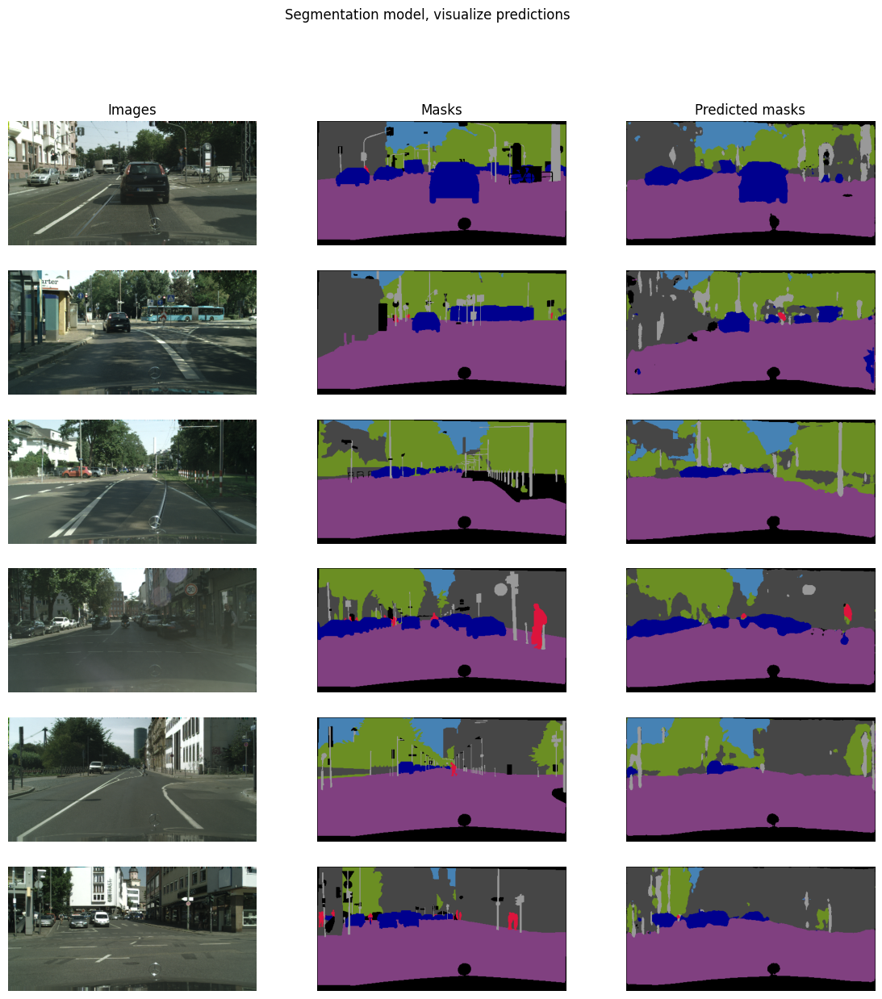

In [24]:
# use custom fonction to visualize some predictions
mf.testModel(model=unet_resnet34, test_gen=test_gen, n_images=6, cats_colors=cats_colors, random_state=16)

In [25]:
del unet_resnet34
import gc
gc.collect()

66620

### V.2. VGG16

In [26]:
# use custom class "generator"

# backbone
backbone_name = 'vgg16'

# with augmentations for training
train_gen = mf.generator(
    batch_size=batch_size,
    images_path='P8_Cityscapes_leftImg8bit_trainvaltest/leftImg8bit/', 
    masks_path='P8_Cityscapes_gtFine_trainvaltest/gtFine/',
    image_size=(256, 256*2),
    which_set="train",
    n_images=512,
    cats=cats,
    backbone = backbone_name,
    augmentation=None,
    shuffle=True
)

valid_gen = mf.generator(
    batch_size=batch_size,
    images_path='P8_Cityscapes_leftImg8bit_trainvaltest/leftImg8bit/', 
    masks_path='P8_Cityscapes_gtFine_trainvaltest/gtFine/',
    image_size=(256, 256*2),
    which_set="val",
    n_images=128,
    cats=cats,
    backbone = backbone_name,
    augmentation=None,
    shuffle=False,
    split=True,
    split_test_size=same_test_size,
    split_keep="split_train",
    split_rs=same_random_state
)


test_gen = mf.generator(
    batch_size=batch_size,
    images_path='P8_Cityscapes_leftImg8bit_trainvaltest/leftImg8bit/', 
    masks_path='P8_Cityscapes_gtFine_trainvaltest/gtFine/',
    image_size=(256, 256*2),
    which_set="val",
    n_images=128,
    cats=cats,
    backbone = None,
    augmentation=None,
    shuffle=False,
    split=True,
    split_test_size=same_test_size,
    split_keep="split_test",
    split_rs=same_random_state
)

In [27]:
# input shape
input_shape = train_gen[0][0][0].shape
# unet model with vgg16 backbone
unet_vgg16 = sm.Unet(
    backbone_name=backbone_name,
    input_shape=input_shape,
    classes=classes,
    activation=activation,
)
# compile
unet_vgg16.compile(
    optimizer=optimizer,
    loss=total_loss,
    metrics=metrics
)
# print summary
unet_vgg16.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 256, 512, 3)]        0         []                            
                                                                                                  
 block1_conv1 (Conv2D)       (None, 256, 512, 64)         1792      ['input_2[0][0]']             
                                                                                                  
 block1_conv2 (Conv2D)       (None, 256, 512, 64)         36928     ['block1_conv1[0][0]']        
                                                                                                  
 block1_pool (MaxPooling2D)  (None, 128, 256, 64)         0         ['block1_conv2[0][0]']        
                                                                                            

In [28]:
if "vgg16.h5" in os.listdir("mySaves/models") :
    unet_vgg16.load_weights("mySaves/models/vgg16.h5")
    training_time = load("mySaves/training_times/vgg16_training_time.joblib")

else :
    # define callback
    callbacks = [
        keras.callbacks.EarlyStopping(monitor="val_iou_score", patience=3, mode="max", restore_best_weights=True, start_from_epoch=10)
    ]
    # initiate timer
    start = time.time()
    # fit
    unet_vgg16.fit(
        x=train_gen,
        steps_per_epoch=len(train_gen),
        epochs=100,
        validation_data=valid_gen,
        callbacks=callbacks
    )
    # get training time
    training_time = time.time() - start
    # save
    unet_vgg16.save_weights("mySaves/models/vgg16.h5")
    dump(training_time,"mySaves/training_times/vgg16_training_time.joblib")

In [29]:
# compute scores on validation set
scores = unet_vgg16.evaluate(valid_gen)

2/2 [==============================] - 22s 9s/step - loss: 0.9837 - iou_score: 0.3018 - f1-score: 0.3473


In [30]:
# update "results" tab
new_results = ["unet", "vgg16", "dice+focal"] + scores[1:] + [training_time, "No"]
results.loc[results.shape[0],:] =  new_results
results

,model,backbone,loss_function,val_iou,val_f_score,training_time,augmentation
0,baseline,,dice+focal,0.387861,0.490223,15553.263523,No
1,unet,resnet34,dice+focal,0.657187,0.7023,4784.311546,No
2,unet,vgg16,dice+focal,0.301794,0.347305,10787.407295,No


1/1 [==============================] - 2s 2s/step


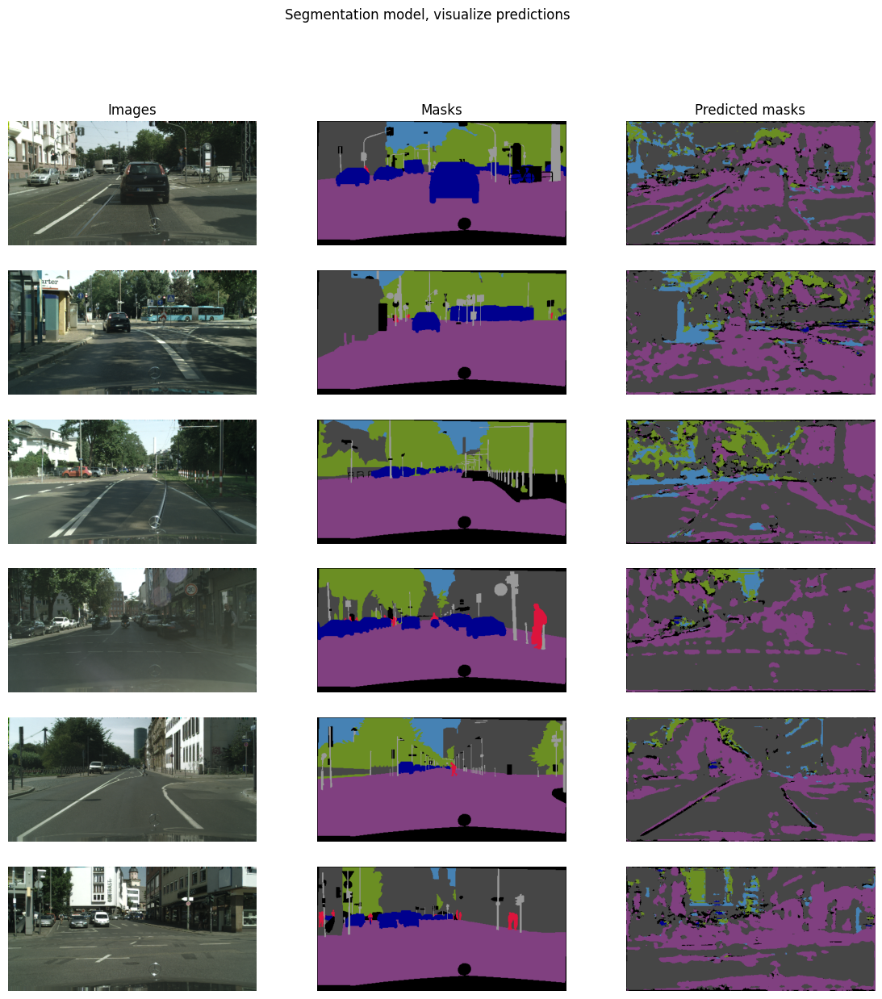

In [31]:
# use custom fonction to visualize some predictions
mf.testModel(model=unet_vgg16, test_gen=test_gen, n_images=6, cats_colors=cats_colors, random_state=16)

In [32]:
del unet_vgg16
import gc
gc.collect()

46210

## VI. Impact de la Data Augmentation

### VI.1. Tester visuellement des augmentations

Dans un premier temps, test visuel de différentes augmentations :

In [33]:
# create au generator without processing
raw_gen = mf.generator(
    batch_size=batch_size,
    images_path='P8_Cityscapes_leftImg8bit_trainvaltest/leftImg8bit/', 
    masks_path='P8_Cityscapes_gtFine_trainvaltest/gtFine/',
    image_size=(256, 256*2),
    which_set="train",
    cats=cats,
    backbone=None,
    augmentation=None,
    shuffle=True
)

In [34]:
# create a dictionnary of albumentations transforms
trans_dict = dict(
    HorizontalFlip = A.HorizontalFlip(p=1),
    VerticalFlip = A.VerticalFlip(p=1),
    ShiftScaleRotate = A.ShiftScaleRotate(shift_limit=0.3, scale_limit=0.3, rotate_limit=30, p=1),
    ElasticTransform = A.ElasticTransform(p=1, alpha=10, sigma=50, alpha_affine=50),
    FancyPCA = A.FancyPCA(p=1, alpha=1),
    RandomGamma = A.RandomGamma(p=1, gamma_limit=(10, 200)),
    Contrast_Limited_Adaptive_Histogram_Equalization = A.CLAHE(p=1, clip_limit=6),
    RandomBrightnessContrast = A.RandomBrightnessContrast(p=1, brightness_limit=0.3, contrast_limit=0.3),
    Sharpen = A.Sharpen(p=1, alpha=(0.3,0.7), lightness=(0.5,1.0)),
    Blur = A.Blur(p=1, blur_limit=9),
    MotionBlur = A.MotionBlur(p=1, blur_limit=9),
    RandomCrop_and_PadIfNeeded = [A.RandomCrop(height=160, width=160*2, p=1), A.PadIfNeeded(min_height=256, min_width=512, border_mode=0, p=1)],
    ColorJitter = A.ColorJitter(p=1, brightness=0.2, contrast=0.2, saturation=0.2),
    HueSaturationValue = A.HueSaturationValue(p=1, hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=20),
    CoarseDropout = A.CoarseDropout(p=1, min_holes=2, max_holes=8, min_height=0.1, max_height=0.2, min_width=0.05, max_width=0.1),
    RandomShadow = A.RandomShadow(p=1, shadow_roi=(0,0.4,1,1), num_shadows_lower=1, num_shadows_upper=4, shadow_dimension=5),
)

Nous pouvons alors visualiser chaque augmentation, et son éventuel impact sur le mask correspondant :

c:\Users\cleme\anaconda3\envs\envProject8\Lib\site-packages\albumentations\core\composition.py:56: UserWarning: transforms is single transform, but a sequence is expected! Transform will be wrapped into list.
  warnings.warn(


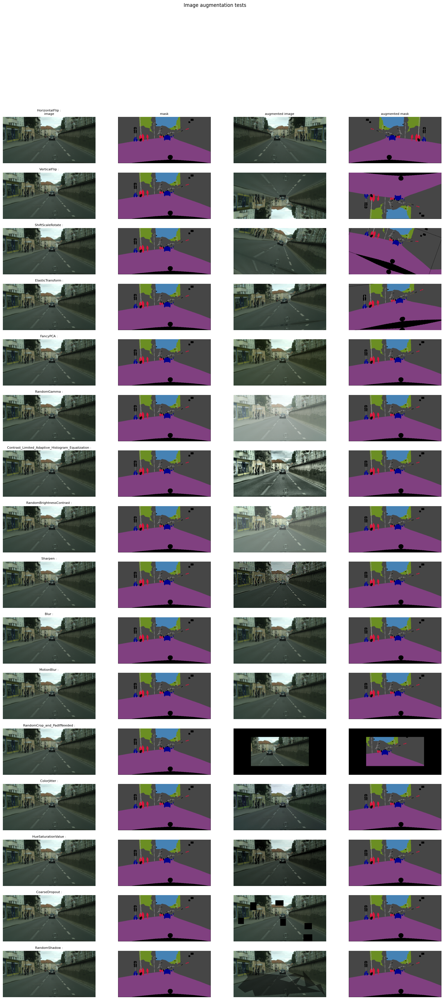

In [35]:
# use custom function to visualize augmentations
mf.testAugmentations(
    gen=raw_gen,
    trans_dict=trans_dict,
    idx=5,
    cats_colors=cats_colors,
)

Liste de transformations sélectionnées pour l'augmentation de données :

In [36]:
# define augmentations for training
list_of_transforms = [
    A.OneOf(
        [
            A.FancyPCA(p=1, alpha=1),
            A.HueSaturationValue(p=1, hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=20),
            A.ColorJitter(p=1, brightness=0.2, contrast=0.2, saturation=0.2),
        ],
        p=0.5
    ),
    A.RandomShadow(
        p=0.5, 
        shadow_roi=(
            0, 0.4,
            1, 1
            ), 
        num_shadows_lower=1, 
        num_shadows_upper=4, 
        shadow_dimension=5
        ),
    A.CoarseDropout(
        p=0.5, 
        min_holes=2, 
        max_holes=8, 
        min_height=0.05, 
        max_height=0.1, 
        min_width=0.025, 
        max_width=0.05
        )
]

Nous pouvons tester notre solution sur quelques images :

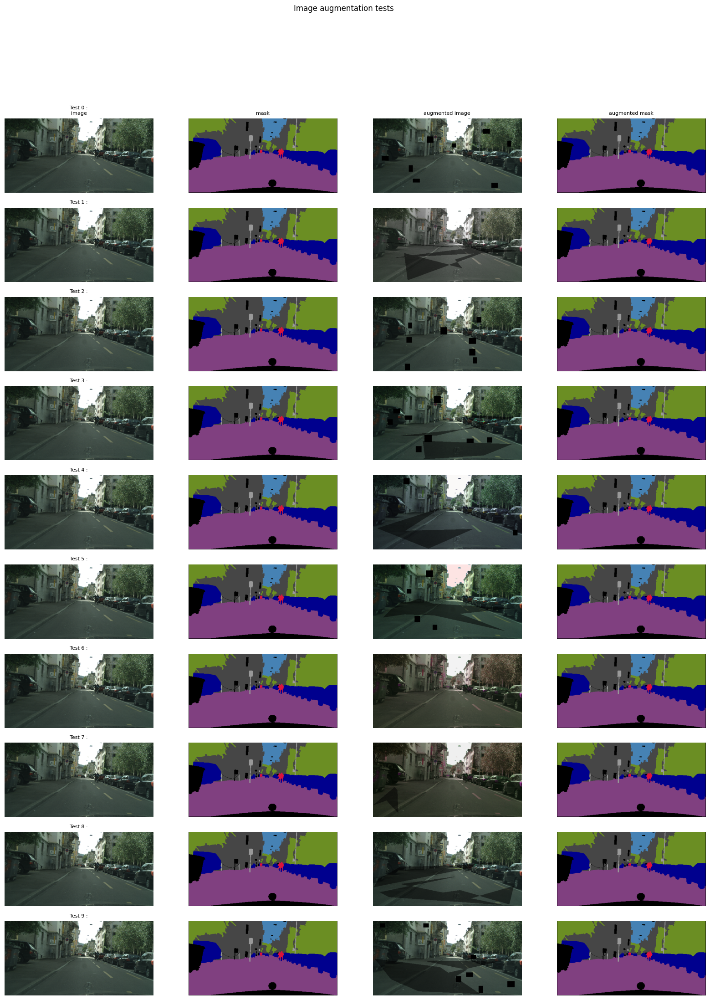

In [37]:
# use custom function to visualize augmentations
mf.testAugmentations(
    gen=raw_gen,
    trans_dict={"Test "+str(i) : list_of_transforms for i in range(10)},
    idx=0,
    cats_colors=cats_colors,
)

### VI.2. *Resnet34* avec Data augmentation

In [38]:
# use custom class "generator"

# backbone
backbone_name = 'resnet34'

# WITH augmentations for training
train_gen = mf.generator(
    batch_size=batch_size,
    images_path='P8_Cityscapes_leftImg8bit_trainvaltest/leftImg8bit/', 
    masks_path='P8_Cityscapes_gtFine_trainvaltest/gtFine/',
    image_size=(256, 256*2),
    which_set="train",
    n_images=512,
    cats=cats,
    backbone = backbone_name,
    augmentation=A.Compose(list_of_transforms),
    shuffle=True
)

valid_gen = mf.generator(
    batch_size=batch_size,
    images_path='P8_Cityscapes_leftImg8bit_trainvaltest/leftImg8bit/', 
    masks_path='P8_Cityscapes_gtFine_trainvaltest/gtFine/',
    image_size=(256, 256*2),
    which_set="val",
    n_images=128,
    cats=cats,
    backbone = backbone_name,
    augmentation=None,
    shuffle=False,
    split=True,
    split_test_size=same_test_size,
    split_keep="split_train",
    split_rs=same_random_state
)


test_gen = mf.generator(
    batch_size=batch_size,
    images_path='P8_Cityscapes_leftImg8bit_trainvaltest/leftImg8bit/', 
    masks_path='P8_Cityscapes_gtFine_trainvaltest/gtFine/',
    image_size=(256, 256*2),
    which_set="val",
    n_images=128,
    cats=cats,
    backbone = None,
    augmentation=None,
    shuffle=False,
    split=True,
    split_test_size=same_test_size,
    split_keep="split_test",
    split_rs=same_random_state
)


In [39]:
# input shape
input_shape = train_gen[0][0][0].shape
# unet model with resnet backbone
unet_resnet34_aug = sm.Unet(
    backbone_name=backbone_name,
    input_shape=input_shape,
    classes=classes,
    activation=activation
)
# compile
unet_resnet34_aug.compile(
    optimizer=optimizer,
    loss=total_loss,
    metrics=metrics
)
# print summary
unet_resnet34_aug.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 data (InputLayer)           [(None, 256, 512, 3)]        0         []                            
                                                                                                  
 bn_data (BatchNormalizatio  (None, 256, 512, 3)          9         ['data[0][0]']                
 n)                                                                                               
                                                                                                  
 zero_padding2d_34 (ZeroPad  (None, 262, 518, 3)          0         ['bn_data[0][0]']             
 ding2D)                                                                                          
                                                                                            

In [40]:

if "resnet34_aug.h5" in os.listdir("mySaves/models") :
    unet_resnet34_aug.load_weights("mySaves/models/resnet34_aug.h5")
    training_time = load("mySaves/training_times/resnet34_aug_training_time.joblib")

else :
    # define callback
    callbacks = [
        keras.callbacks.EarlyStopping(monitor="val_iou_score", patience=3, mode="max", restore_best_weights=True, start_from_epoch=10)
    ]
    # initiate timer
    start = time.time()
    # fit
    unet_resnet34_aug.fit(
        x=train_gen,
        steps_per_epoch=len(train_gen),
        epochs=100,
        validation_data=valid_gen,
        callbacks=callbacks
    )
    # get training time
    training_time = time.time() - start
    # save
    unet_resnet34_aug.save_weights("mySaves/models/resnet34_aug.h5")
    dump(training_time,"mySaves/training_times/resnet34_aug_training_time.joblib")

In [41]:
# compute scores on validation set
scores = unet_resnet34_aug.evaluate(valid_gen)

2/2 [==============================] - 13s 5s/step - loss: 0.9239 - iou_score: 0.6575 - f1-score: 0.7216


In [42]:
# update "results" tab
new_results = ["unet", "resnet34", "dice+focal"] + scores[1:] + [training_time, "Yes"]
results.loc[results.shape[0],:] =  new_results
results

,model,backbone,loss_function,val_iou,val_f_score,training_time,augmentation
0,baseline,,dice+focal,0.387861,0.490223,15553.263523,No
1,unet,resnet34,dice+focal,0.657187,0.7023,4784.311546,No
2,unet,vgg16,dice+focal,0.301794,0.347305,10787.407295,No
3,unet,resnet34,dice+focal,0.657512,0.721638,9438.153805,Yes


1/1 [==============================] - 2s 2s/step


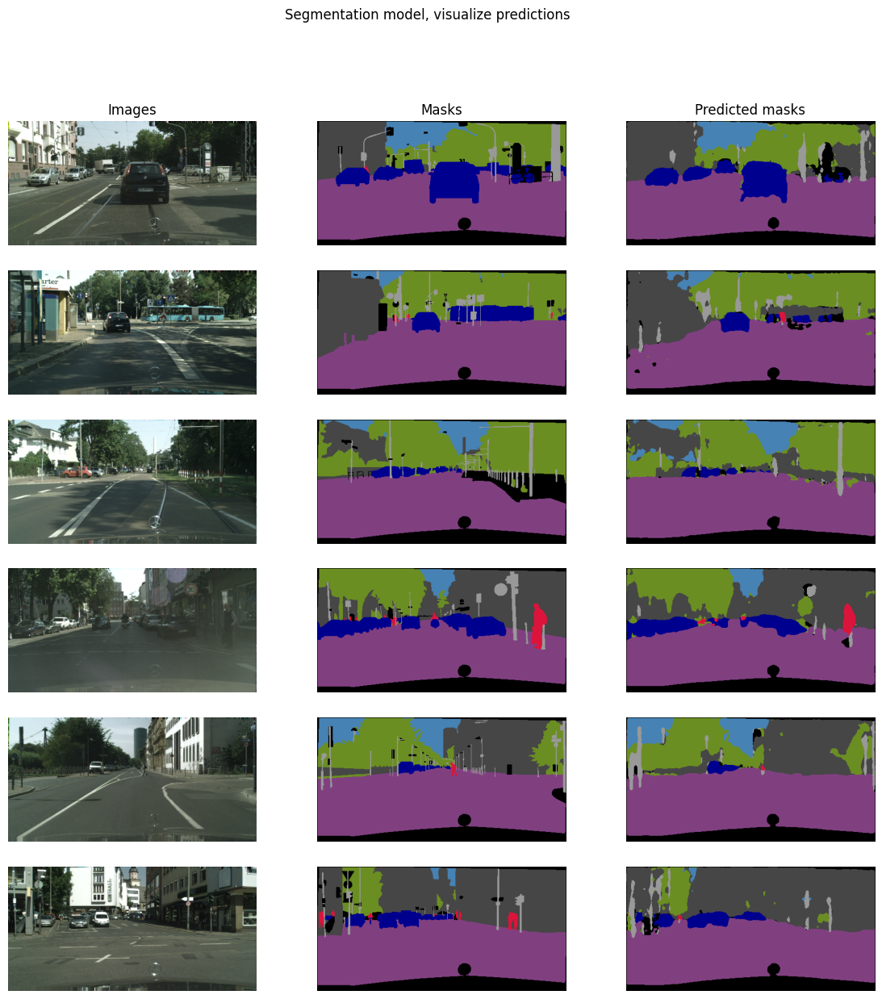

In [43]:
# use custom fonction to visualize some predictions
mf.testModel(model=unet_resnet34_aug, test_gen=test_gen, n_images=6, cats_colors=cats_colors, random_state=16)

## VII. Améliorer l'hyperparamètre "fonction de perte"

Détermination du `IoU` **par classe** :

In [44]:
# initiate our MeanIoU
MeanIoU = keras.metrics.MeanIoU(num_classes=len(cats))
# prediction on validation set
y_pred = np.argmax(
    unet_resnet34_aug.predict(valid_gen), 
    axis=-1
    )
# test masks
y_true = np.argmax(
    np.vstack(
        [valid_gen[i][1] for i in range(len(valid_gen))]
        ),
        axis=-1
        )

# compute IoU
MeanIoU.update_state(y_true=y_true, y_pred=y_pred)

# compute IoU for each class
IoU_values = MeanIoU.get_weights()[0]

IoU_classes = IoU_values.diagonal()/IoU_values.sum(axis=1)

# put results in a dataframe
IoU_tab = pd.DataFrame(index=range(len(cats)))

IoU_tab["macro_cats"] = list(cats.keys())

IoU_tab["IoU_classes"] = IoU_classes

IoU_tab

2/2 [==============================] - 12s 5s/step


,macro_cats,IoU_classes
0,void,0.765797
1,flat,0.975609
2,construction,0.921315
3,object,0.358531
4,nature,0.853648
5,sky,0.924944
6,human,0.505805
7,vehicle,0.715172


Maintenant nous pouvons tester d'autres valeurs pour l'argument `class_weight` de la fonction de perte `DiceLoss` :

In [45]:
# create class weights based on iou results
class_weights = 1 / IoU_classes
class_weights = class_weights / class_weights.sum()
IoU_tab["class_weights"] = class_weights
IoU_tab

,macro_cats,IoU_classes,class_weights
0,void,0.765797,0.110352
1,flat,0.975609,0.086620
2,construction,0.921315,0.091725
3,object,0.358531,0.235704
4,nature,0.853648,0.098995
5,sky,0.924944,0.091365
6,human,0.505805,0.167075
7,vehicle,0.715172,0.118164


In [46]:
del unet_resnet34_aug
import gc
gc.collect()

71647

In [47]:
# input shape
input_shape = train_gen[0][0][0].shape

# this time, use class_weights based on IoU results per class
dice_loss_cw = sm.losses.DiceLoss(class_weights=class_weights)
focal_loss = sm.losses.CategoricalFocalLoss()
total_loss_cw = dice_loss_cw + (1 * focal_loss)

# unet model with resnet backbone
unet_resnet34_aug_cw = sm.Unet(
    backbone_name=backbone_name,
    input_shape=input_shape,
    classes=classes,
    activation=activation
)
# compile
unet_resnet34_aug_cw.compile(
    optimizer=optimizer,
    loss=total_loss_cw,
    metrics=metrics
)
# print summary
unet_resnet34_aug_cw.summary()



Model: "model_6"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 data (InputLayer)           [(None, 256, 512, 3)]        0         []                            
                                                                                                  
 bn_data (BatchNormalizatio  (None, 256, 512, 3)          9         ['data[0][0]']                
 n)                                                                                               
                                                                                                  
 zero_padding2d_68 (ZeroPad  (None, 262, 518, 3)          0         ['bn_data[0][0]']             
 ding2D)                                                                                          
                                                                                            

In [48]:

if "resnet34_aug_cw.h5" in os.listdir("mySaves/models") :
    unet_resnet34_aug_cw.load_weights("mySaves/models/resnet34_aug_cw.h5")
    training_time = load("mySaves/training_times/resnet34_aug_cw_training_time.joblib")

else :
    # define callback
    callbacks = [
        keras.callbacks.EarlyStopping(monitor="val_iou_score", patience=3, mode="max", restore_best_weights=True, start_from_epoch=10)
    ]
    # initiate timer
    start = time.time()
    # fit
    unet_resnet34_aug_cw.fit(
        x=train_gen,
        steps_per_epoch=len(train_gen),
        epochs=100,
        validation_data=valid_gen,
        callbacks=callbacks
    )
    # get training time
    training_time = time.time() - start
    # save
    unet_resnet34_aug_cw.save_weights("mySaves/models/resnet34_aug_cw.h5")
    dump(training_time,"mySaves/training_times/resnet34_aug_cw_training_time.joblib")

In [49]:
# compute scores on validation set
scores = unet_resnet34_aug_cw.evaluate(valid_gen)

2/2 [==============================] - 13s 5s/step - loss: 0.9297 - iou_score: 0.6639 - f1-score: 0.7320


In [50]:
# update "results" tab
new_results = ["unet", "resnet34", "dice_CW+focal"] + scores[1:] + [training_time, "Yes"]
results.loc[results.shape[0],:] =  new_results
results

,model,backbone,loss_function,val_iou,val_f_score,training_time,augmentation
0,baseline,,dice+focal,0.387861,0.490223,15553.263523,No
1,unet,resnet34,dice+focal,0.657187,0.7023,4784.311546,No
2,unet,vgg16,dice+focal,0.301794,0.347305,10787.407295,No
3,unet,resnet34,dice+focal,0.657512,0.721638,9438.153805,Yes
4,unet,resnet34,dice_CW+focal,0.663929,0.731985,8842.969852,Yes


1/1 [==============================] - 1s 1s/step


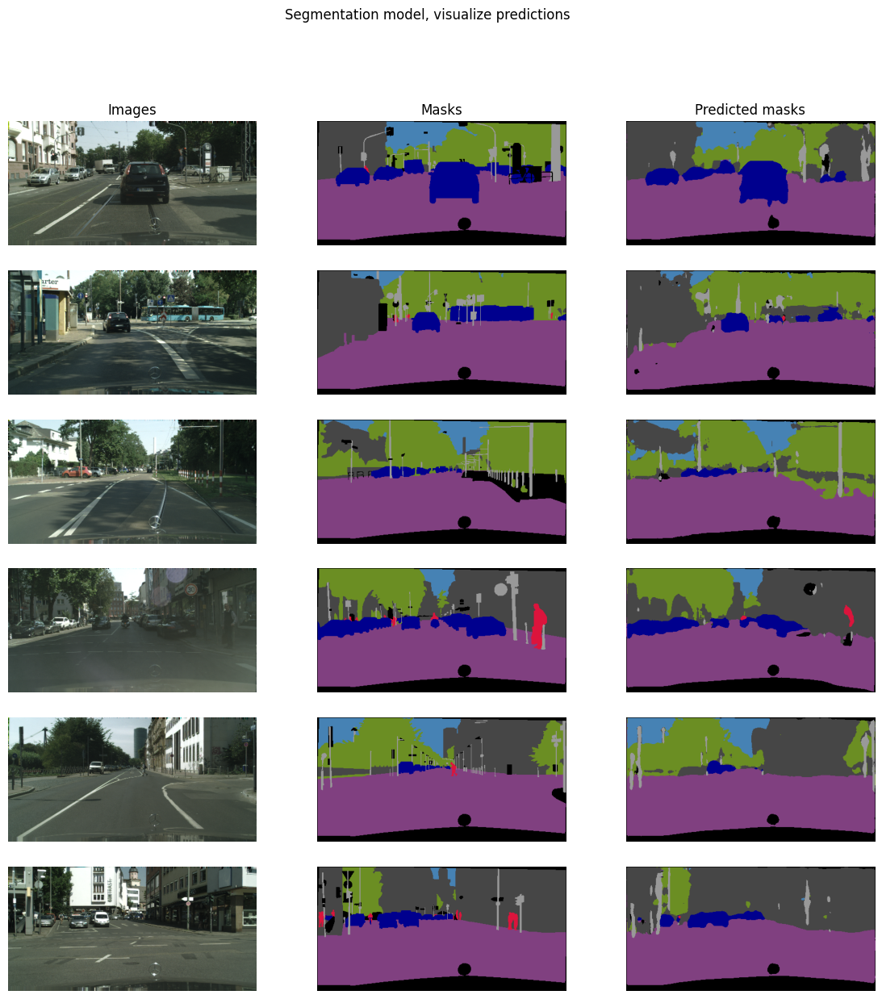

In [51]:
# use custom fonction to visualize some predictions
mf.testModel(model=unet_resnet34_aug_cw, test_gen=test_gen, n_images=6, cats_colors=cats_colors, random_state=16)

In [52]:
del unet_resnet34_aug_cw
import gc
gc.collect()

66640

# Exporter le modèle pour l'API

Pour la mise en production du modèle, nous allons utiliser plus de données pour l'entraînement et enregistrer le modèle au format TFLite :

## Entraîner sur plus de données

In [53]:
# use custom class "generator"

# backbone
backbone_name = 'resnet34'

# WITH augmentations for training
train_gen = mf.generator(
    batch_size=batch_size,
    images_path='P8_Cityscapes_leftImg8bit_trainvaltest/leftImg8bit/', 
    masks_path='P8_Cityscapes_gtFine_trainvaltest/gtFine/',
    image_size=(256, 256*2),
    which_set="train",
    n_images=None,
    cats=cats,
    backbone = backbone_name,
    augmentation=A.Compose(list_of_transforms),
    shuffle=True
)

valid_gen = mf.generator(
    batch_size=batch_size,
    images_path='P8_Cityscapes_leftImg8bit_trainvaltest/leftImg8bit/', 
    masks_path='P8_Cityscapes_gtFine_trainvaltest/gtFine/',
    image_size=(256, 256*2),
    which_set="val",
    n_images=None,
    cats=cats,
    backbone = backbone_name,
    augmentation=None,
    shuffle=False,
    split=True,
    split_test_size=same_test_size,
    split_keep="split_train",
    split_rs=same_random_state
)


test_gen = mf.generator(
    batch_size=batch_size,
    images_path='P8_Cityscapes_leftImg8bit_trainvaltest/leftImg8bit/', 
    masks_path='P8_Cityscapes_gtFine_trainvaltest/gtFine/',
    image_size=(256, 256*2),
    which_set="val",
    n_images=None,
    cats=cats,
    backbone = None,
    augmentation=None,
    shuffle=False,
    split=True,
    split_test_size=same_test_size,
    split_keep="split_test",
    split_rs=same_random_state
)


In [54]:
# input shape
input_shape = train_gen[0][0][0].shape
# unet model with resnet backbone
unet_resnet34_prod = sm.Unet(
    backbone_name=backbone_name,
    input_shape=input_shape,
    classes=classes,
    activation=activation
)
# compile with class_weight loss
unet_resnet34_prod.compile(
    optimizer=optimizer,
    loss=total_loss_cw,
    metrics=metrics
)
# print summary
unet_resnet34_prod.summary()



Model: "model_8"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 data (InputLayer)           [(None, 256, 512, 3)]        0         []                            
                                                                                                  
 bn_data (BatchNormalizatio  (None, 256, 512, 3)          9         ['data[0][0]']                
 n)                                                                                               
                                                                                                  
 zero_padding2d_102 (ZeroPa  (None, 262, 518, 3)          0         ['bn_data[0][0]']             
 dding2D)                                                                                         
                                                                                            

In [55]:
if "resnet34_prod.h5" in os.listdir("mySaves/models") :
    unet_resnet34_prod.load_weights("mySaves/models/resnet34_prod.h5")
    training_time = load("mySaves/training_times/resnet34_prod_training_time.joblib")

else :
    # define callback
    callbacks = [
        keras.callbacks.EarlyStopping(monitor="val_iou_score", patience=3, mode="max", restore_best_weights=True, start_from_epoch=10)
    ]
    # initiate timer
    start = time.time()
    # fit
    unet_resnet34_prod.fit(
        x=train_gen,
        steps_per_epoch=len(train_gen),
        epochs=100,
        validation_data=valid_gen,
        callbacks=callbacks
    )
    # get training time
    training_time = time.time() - start
    # save
    unet_resnet34_prod.save_weights("mySaves/models/resnet34_prod.h5")
    dump(training_time,"mySaves/training_times/resnet34_prod_training_time.joblib")

In [56]:
# compute scores on test set
scores = unet_resnet34_prod.evaluate(test_gen)

4/4 [==============================] - 23s 5s/step - loss: 0.9129 - iou_score: 0.7487 - f1-score: 0.8278


## Sauvegarder au format TfLite

In [57]:
# create a folder to save our lite model
if not os.path.isdir("Patin_Clement_2_API_042024/TFLite"):
    os.mkdir("Patin_Clement_2_API_042024/TfLite")

In [58]:
if ("resnet34_prod.tflite" not in os.listdir("Patin_Clement_2_API_042024/TfLite")) :
    # save with tf_lite
    converter = tf.lite.TFLiteConverter.from_keras_model(unet_resnet34_prod)
    # to avoid error
    converter.target_spec.supported_ops = [tf.lite.OpsSet.TFLITE_BUILTINS, tf.lite.OpsSet.SELECT_TF_OPS]
    converter._experimental_lower_tensor_list_ops = False
    # convert
    tflite_model = converter.convert()
    # save
    with open("Patin_Clement_2_API_042024/TfLite"+"/resnet34_prod.tflite", 'wb') as f:
        f.write(tflite_model)

## Enregistrer des images pour le test de l'API

In [59]:
# save some images for the Flask web app

n_images = 10

# create folders to save images and masks
if not os.path.isdir("Patin_Clement_3_application_Flask_042024/static/test_images"):
    os.mkdir("Patin_Clement_3_application_Flask_042024/static/test_images")
if not os.path.isdir("Patin_Clement_3_application_Flask_042024/static/test_masks"):
    os.mkdir("Patin_Clement_3_application_Flask_042024/static/test_masks")
if not os.path.isdir("Patin_Clement_3_application_Flask_042024/static/predicted_mask"):
    os.mkdir("Patin_Clement_3_application_Flask_042024/static/predicted_mask")

# random seed
np.random.seed(seed=3)

# pick one batch
some_batch_index = np.random.choice(np.arange(len(test_gen)), size = 1)[0]
some_batch = test_gen[some_batch_index]
# pick n_images idx from this batch
some_batch_examples_idx = np.random.choice(np.arange(len(some_batch[0])), size = n_images)
some_images = np.array([some_batch[0][i] for i in some_batch_examples_idx])
some_masks = np.array([some_batch[1][i] for i in some_batch_examples_idx])

# get class label for each pixel then put them in a channel
some_masks = np.argmax(some_masks, axis=3)
# change colors
color_map = np.array([
    [  0,   0,   0],
    [128,  64, 128],
    [ 70,  70,  70],
    [153, 153, 153],
    [107, 142,  35],
    [ 70, 130, 180],
    [220,  20,  60],
    [  0,   0, 142]
    ])

some_masks = color_map[some_masks]

# save
for i in range(len(some_images)) :
    keras.utils.save_img(path = "Patin_Clement_3_application_Flask_042024/static/test_images/"+str(i+1)+".png", x = some_images[i])
    keras.utils.save_img(path = "Patin_Clement_3_application_Flask_042024/static/test_masks/"+str(i+1)+".png", x = some_masks[i])

# TEST API en local

In [60]:
# import requests

# API_URL = "http://localhost:8000"

# headers = {"accept" : "application/json"}

# files=[
#     ('img',('1.png', open('Patin_Clement_3_application_Flask_042024/static/test_images/1.png', 'rb'), 'image/png'))
# ]

# response = requests.post(url = API_URL+"/predict", headers=headers,  files=files).json()

In [61]:
# # display(keras.preprocessing.image.array_to_img(image[0]))
# import json
# image = json.loads(response["mask"])

# display(keras.preprocessing.image.array_to_img(image))